In [1]:
import pafy

url = "https://www.youtube.com/watch?v=4mpX7vlz21k"
video = pafy.new(url)


In [2]:
audiostreams = video.audiostreams
for a in audiostreams:
    print(a.bitrate, a.extension, a.get_filesize())
    
print(audiostreams[2].url)
title = audiostreams[2].title
audiostreams[2].download(filepath="/home/py/projects/tmp/tmp.m4a")

50k webm 448520
70k webm 608211
128k m4a 1065691
160k webm 1161161
128k webm 1126245
http://r5---sn-8xgp1vo-xfge7.googlevideo.com/videoplayback?id=e26a57eef973db59&itag=140&source=youtube&pl=24&mn=sn-8xgp1vo-xfge7&mm=31&ms=au&mv=m&initcwndbps=2023750&pcm2cms=yes&ratebypass=yes&mime=audio/mp4&gir=yes&clen=1065691&lmt=1452393543174518&dur=67.059&fexp=9406994,9419452,9422342,9422596,9427379,9428398,9431012,9433096,9433223,9433946,9435526,9435742,9438327,9438662,9438805,9439362,9439580,9440831,9440957,9441347,9441773,9442320,9442424,9442426,9444125,9444451,9444649,9444738&upn=cwcNDu-1Qds&key=dg_yt0&mt=1471194762&signature=0ED397249817F9FC5BCD41F0CADABD3F637D4699.72D4B1222D97611C9381737E133148480E909C01&sver=3&ip=98.116.86.33&ipbits=0&expire=1471217091&sparams=ip,ipbits,expire,id,itag,source,pl,mn,mm,ms,mv,initcwndbps,pcm2cms,ratebypass,mime,gir,clen,lmt,dur


'/home/py/projects/tmp/tmp.m4a'

In [3]:
%matplotlib inline

# Beat tracking example
from __future__ import print_function
import numpy as np, scipy, matplotlib.pyplot as plt, librosa
from IPython.display import Audio

# Load the example clip
y, sr = librosa.load('/home/py/projects/tmp/tmp.m4a')


In [5]:
# Separate harmonics and percussives into two waveforms
y_harmonic, y_percussive = librosa.effects.hpss(y)


In [21]:
print(y.shape)
print(y_harmonic.shape)
print(y_percussive.shape)
print(sr)

(1478656,)
(1478656,)
(1478656,)
22050


In [8]:
Audio(y, rate=sr)

In [9]:
Audio(y_harmonic, rate=sr)

In [10]:
Audio(y_percussive, rate=sr)

In [11]:
# Beat track on the percussive signal
tempo, beat_frames = librosa.beat.beat_track(y=y_percussive, sr=sr)
print('Estimated tempo: {:.2f} beats per minute'.format(tempo))
print(beat_frames.shape)

Estimated tempo: 99.38 beats per minute
(108,)


In [12]:
# 4. Convert the frame indices of beat events into timestamps
beat_times = librosa.frames_to_time(beat_frames, sr=sr)
print(beat_times.shape)

(108,)


In [13]:
# Compute MFCC features from the raw signal
hop_length = 512
mfcc = librosa.feature.mfcc(y=y, sr=sr, hop_length=hop_length, n_mfcc=13)

In [14]:
# And the first-order differences (delta features)
mfcc_delta = librosa.feature.delta(mfcc)

In [15]:
# Stack and synchronize between beat events
# This time, we'll use the mean value (default) instead of median
beat_mfcc_delta = librosa.feature.sync(np.vstack([mfcc, mfcc_delta]), beat_frames)

In [16]:
# Compute chroma features from the harmonic signal
chromagram = librosa.feature.chroma_cqt(y=y_harmonic, sr=sr)

/usr/local/lib/python3.5/dist-packages/numpy/core/numeric.py:482: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return array(a, dtype, copy=False, order=order)


In [18]:
# Aggregate chroma features between beat events
# We'll use the median value of each feature between beat frames
beat_chroma = librosa.feature.sync(chromagram, beat_frames, aggregate=np.median)
print(beat_chroma[:,0])

[ 0.54022876  0.98591951  0.44029065  0.70013534  0.67144286  0.33046138
  0.44206835  0.61762662  0.58601027  0.66921692  0.53419859  0.44855704]


In [19]:
# Finally, stack all beat-synchronous features together
beat_features = np.vstack([beat_chroma, beat_mfcc_delta])
print(beat_features)

[[ 0.54022876  0.33187505  0.48475831 ...,  0.15957714  0.23743282
   0.44803827]
 [ 0.98591951  0.24121143  0.26089929 ...,  0.36398472  0.27833473
   0.4674928 ]
 [ 0.44029065  0.16332639  0.09271553 ...,  0.57086568  0.32913395
   0.34962116]
 ..., 
 [-1.86537736 -0.0578424  -0.00380993 ..., -0.29003269 -0.09603218
   0.0554621 ]
 [ 0.5322929   0.11319094 -0.08724685 ..., -0.00979188 -0.01680644
  -0.06786835]
 [-0.15240413 -0.09340872 -0.04076333 ...,  0.21285642 -0.04643357
   0.02736435]]


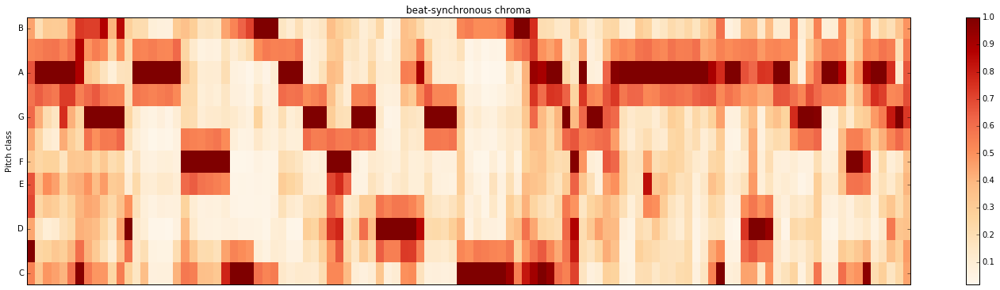

In [20]:
plt.figure(figsize=(20,10))
plt.subplot(2,1,1)
librosa.display.specshow(beat_chroma, y_axis='chroma')
plt.title('beat-synchronous chroma')
plt.colorbar()
plt.tight_layout()